In [1]:
import cv2
import glob
import pickle
import imageio
import numpy as np
import matplotlib.pyplot as plt

imageio.plugins.ffmpeg.download()

from moviepy.editor import VideoFileClip
from matplotlib.image import imsave

### Config

In [2]:
OUT_PUT_IMAGE_PATTERN = "./output_images/{}.png"

### Image

In [3]:
def load_image_from_address(address):
    image = cv2.imread(address)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

### Test

In [4]:
def load_test_chess_image():
    return load_image_from_address("camera_cal/test_calibration.jpg")

def load_test_road_image():
    return load_image_from_address("test_images/straight_lines1.jpg")

def get_test_images_size():
    return len([name for name in glob.glob('test_images/*.jpg')])

### Line class

In [5]:
class Lane:
    left_fit = None
    right_fit = None
    curvature = None
    position = None
    binary_warped = None
    is_ok = True

### Camera Calibration

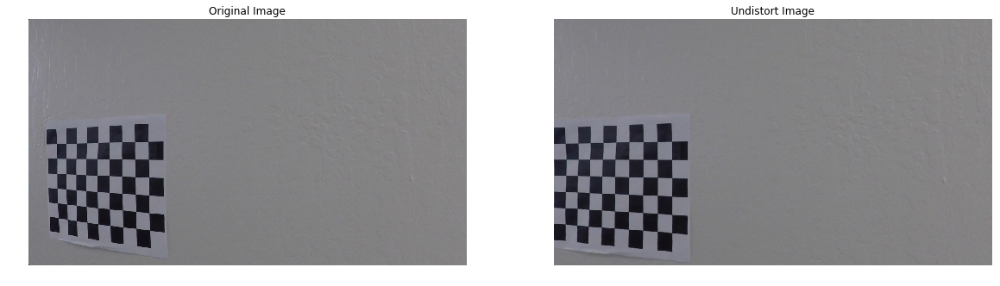

In [6]:
camera_calibration_matrix = None
camera_calibration_distance = None

def load_camera_calibration_images(camera_calibration_image_points, camera_calibration_object_points):
    
    chess_board_points = np.zeros((6 * 9, 3), np.float32)
    chess_board_points[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)
    
    for image_address in glob.glob('camera_cal/cal*.jpg'):
        image = load_image_from_address(image_address)
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        
        ret, chess_corners = cv2.findChessboardCorners(gray, (9, 6), None)
        
        if ret == True:
            camera_calibration_image_points.append(chess_corners)
            camera_calibration_object_points.append(chess_board_points)

def init_camera_calibration():
    
    camera_calibration_image_points = []
    camera_calibration_object_points = []
    
    image = load_test_chess_image()
    
    load_camera_calibration_images(camera_calibration_image_points, camera_calibration_object_points)
    _, camera_calibration_matrix, camera_calibration_distance, _, _ = cv2.calibrateCamera(camera_calibration_object_points, camera_calibration_image_points, (image.shape[1], image.shape[0]), None, None)

    pickle.dump({'matrix': camera_calibration_matrix, 'distance': camera_calibration_distance}, open('camera_calibration.pkl', 'wb'))

def undistort_camera_image(image):
    global camera_calibration_matrix, camera_calibration_distance
    
    if camera_calibration_matrix is None or camera_calibration_distance is None:
        try:
            camera_calibration = pickle.load(open('camera_calibration.pkl', 'rb'))
        except:
            init_camera_calibration()
            camera_calibration = pickle.load(open('camera_calibration.pkl', 'rb'))
                
        camera_calibration_matrix = camera_calibration["matrix"]
        camera_calibration_distance = camera_calibration["distance"]
        
    return cv2.undistort(image, camera_calibration_matrix, camera_calibration_distance, None, camera_calibration_matrix)


def test_undistortation():
    
    test_image = load_test_chess_image()
    undistort_image = undistort_camera_image(test_image)
    
    fig, axs = plt.subplots(1, 2, figsize=(20, 20))
    
    axs[0].imshow(test_image.squeeze())
    axs[0].set_title("Original Image")
    axs[0].axis('off')
    
    axs[1].imshow(undistort_image.squeeze())
    axs[1].set_title("Undistort Image")
    axs[1].axis('off')
    
    plt.show()

test_undistortation()

### Prespective transform

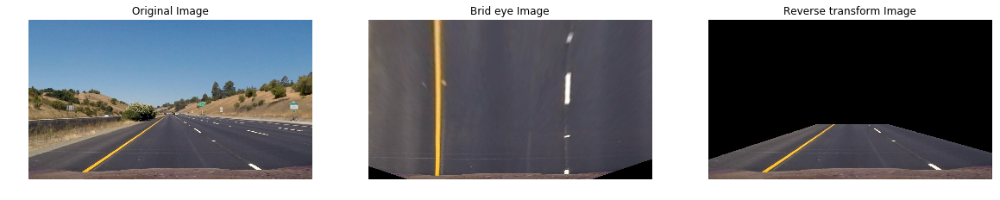

In [7]:
prespective_transform_matrix = None
reverse_prespective_transform_matrix = None

def init_prespective_transform():
    src = np.float32([
        [220,  720],
        [1150, 720],
        [570,  470],
        [720,  470]
    ])
    
    dst = np.float32([
        [320,  720],
        [920,  720],
        [320,    0],
        [920,    0] 
    ])
    
    global prespective_transform_matrix, reverse_prespective_transform_matrix
    
    prespective_transform_matrix = cv2.getPerspectiveTransform(src, dst)
    reverse_prespective_transform_matrix = cv2.getPerspectiveTransform(dst, src)
        
def prespective_transform(image):
    return cv2.warpPerspective(image, prespective_transform_matrix, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)

def reverse_prespective_transform(image):
    return cv2.warpPerspective(image, reverse_prespective_transform_matrix, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)

def test_prespective_transform():
    
    test_image = load_test_road_image()
    transform_image = prespective_transform(test_image)
    reverse_image = reverse_prespective_transform(transform_image)
    
    fig, axs = plt.subplots(1, 3, figsize=(20, 30))
    
    axs[0].imshow(test_image.squeeze())
    axs[0].set_title("Original Image")
    axs[0].axis('off')
    
    axs[1].imshow(transform_image.squeeze())
    axs[1].set_title("Brid eye Image")
    axs[1].axis('off')
    
    axs[2].imshow(reverse_image.squeeze())
    axs[2].set_title("Reverse transform Image")
    axs[2].axis('off')
    
    plt.show()

init_prespective_transform()
test_prespective_transform()

### Sobel tranform

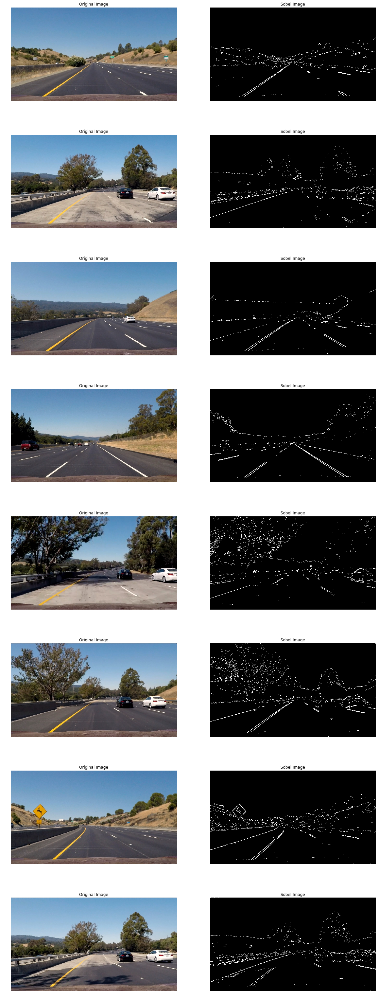

In [8]:
SOBEL_KERNEL_SIZE = 5

def abs_sobel_thresh(image, orient, sobel_kernel=3, thresh=(0, 255)):
    
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel))

    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return binary_output

def mag_sobel_thresh(image, sobel_kernel=3, thresh=(0, 255)):
    
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    grad_mag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(grad_mag) / 255 
    grad_mag = (grad_mag / scale_factor).astype(np.uint8) 

    binary_output = np.zeros_like(grad_mag)
    binary_output[(grad_mag >= thresh[0]) & (grad_mag <= thresh[1])] = 1

    return binary_output

def dir_sobel_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):

    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    abs_grad_dir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(abs_grad_dir)
    binary_output[(abs_grad_dir >= thresh[0]) & (abs_grad_dir <= thresh[1])] = 1

    return binary_output


def sobel_transform(image):
    
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    gradx = abs_sobel_thresh(gray, orient='x', sobel_kernel=SOBEL_KERNEL_SIZE, thresh=(10, 240))
    grady = abs_sobel_thresh(gray, orient='y', sobel_kernel=SOBEL_KERNEL_SIZE, thresh=(60, 240))    
    mag_binary = mag_sobel_thresh(gray, sobel_kernel=SOBEL_KERNEL_SIZE, thresh=(50, 240))
    dir_binary = dir_sobel_threshold(gray, sobel_kernel=SOBEL_KERNEL_SIZE, thresh=(0.6, 1.1))

    combined = np.zeros_like(gray)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined


def test_sobel_transform():
    
    index = get_test_images_size()
    fig, axs = plt.subplots(index, 2, figsize=(20, index * 7))
    
    for i, image_address in enumerate(glob.glob('test_images/*.jpg')):
        image = load_image_from_address(image_address)
        output = sobel_transform(image)

        axs[i][0].imshow(image.squeeze())
        axs[i][0].set_title("Original Image")
        axs[i][0].axis('off')

        axs[i][1].imshow(output.squeeze(), cmap='gray')
        axs[i][1].set_title("Sobel Image")
        axs[i][1].axis('off')
    
    plt.show()

test_sobel_transform()

### Color transform

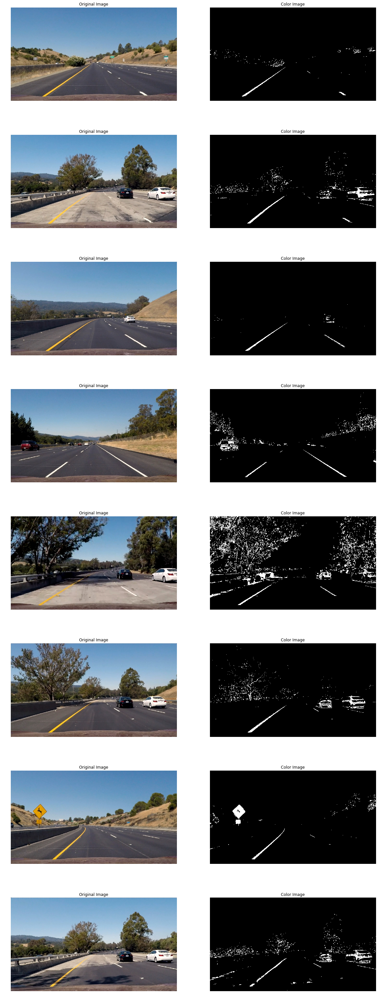

In [9]:
def color_transform_filter(image, thresh=(0, 255)):
    s_channel = image[:, :, 2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= thresh[0]) & (s_channel <= thresh[1])] = 1
    
    return s_binary

def color_transform(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    return color_transform_filter(hls, thresh=(160, 255))

def test_color_transform():
    index = get_test_images_size()
    fig, axs = plt.subplots(index, 2, figsize=(20, index * 7))
    
    for i, image_address in enumerate(glob.glob('test_images/*.jpg')):
        image = load_image_from_address(image_address)
        output = color_transform(image)

        axs[i][0].imshow(image.squeeze())
        axs[i][0].set_title("Original Image")
        axs[i][0].axis('off')

        axs[i][1].imshow(output.squeeze(), cmap='gray')
        axs[i][1].set_title("Color Image")
        axs[i][1].axis('off')
    
    plt.show()

test_color_transform()

### Threshold transform (Apply both sobel and color thresholding)

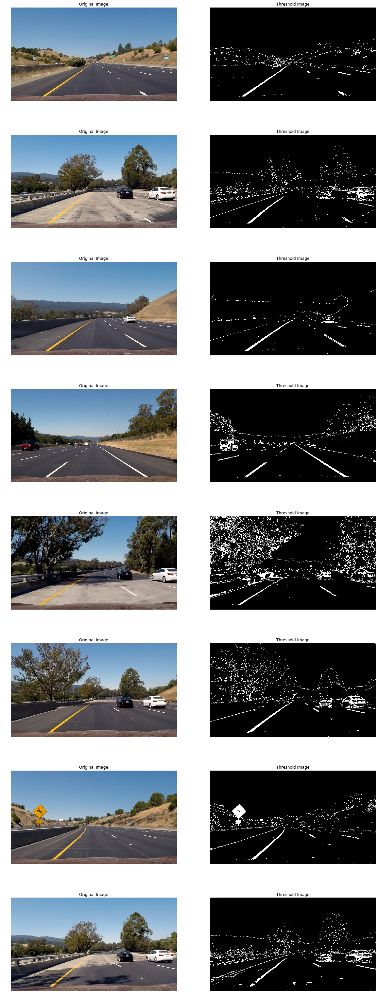

In [10]:
def threshold_transform(image):
    sobel_transform_image = sobel_transform(image)
    color_transform_image = color_transform(image)
    
    combined_binary = np.zeros_like(sobel_transform_image)
    combined_binary[(color_transform_image == 1) | (sobel_transform_image == 1)] = 1
    
    return combined_binary

def test_threshold_transform():
    
    index = get_test_images_size()
    fig, axs = plt.subplots(index, 2, figsize=(20, index * 7))
    
    for i, image_address in enumerate(glob.glob('test_images/*.jpg')):
        image = load_image_from_address(image_address)
        output = threshold_transform(image)

        axs[i][0].imshow(image.squeeze())
        axs[i][0].set_title("Original Image")
        axs[i][0].axis('off')

        axs[i][1].imshow(output.squeeze(), cmap='gray')
        axs[i][1].set_title("Threshold Image")
        axs[i][1].axis('off')
    
    plt.show()

test_threshold_transform()

### Region of interest

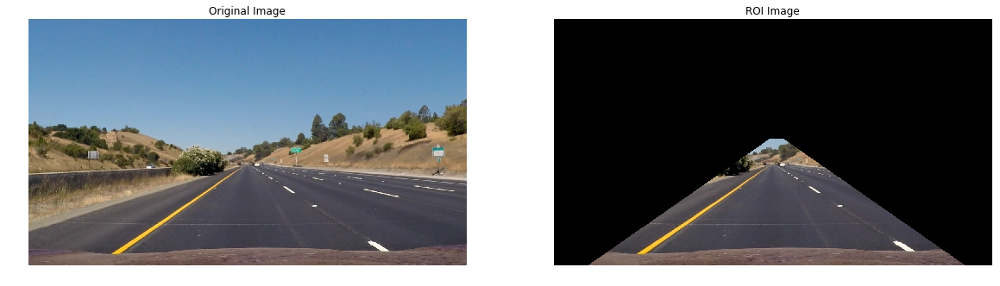

In [11]:
def region_of_interest_transform(image, vertices):
    mask = np.zeros_like(image)
    cv2.fillPoly(mask, vertices, (255, ) * image.shape[2] if len(image.shape) > 2 else (255, ))
    return cv2.bitwise_and(image, mask)

def region_of_interest(image):
    
    left_bottom = (100, 720)
    right_bottom = (1200, 720)
    
    left_top = (630, 350)
    right_top = (670, 350)
    
    vertices = np.array([[left_bottom, right_bottom, right_top, left_top]], dtype=np.int32)
    
    return region_of_interest_transform(image, vertices)

def test_region_of_interest():
    
    test_image = load_test_road_image()
    transform_image = region_of_interest(test_image)
    
    fig, axs = plt.subplots(1, 2, figsize=(20, 20))
    
    axs[0].imshow(test_image.squeeze())
    axs[0].set_title("Original Image")
    axs[0].axis('off')
    
    axs[1].imshow(transform_image.squeeze())
    axs[1].set_title("ROI Image")
    axs[1].axis('off')
    
    plt.show()

test_region_of_interest()

### Transform pipline

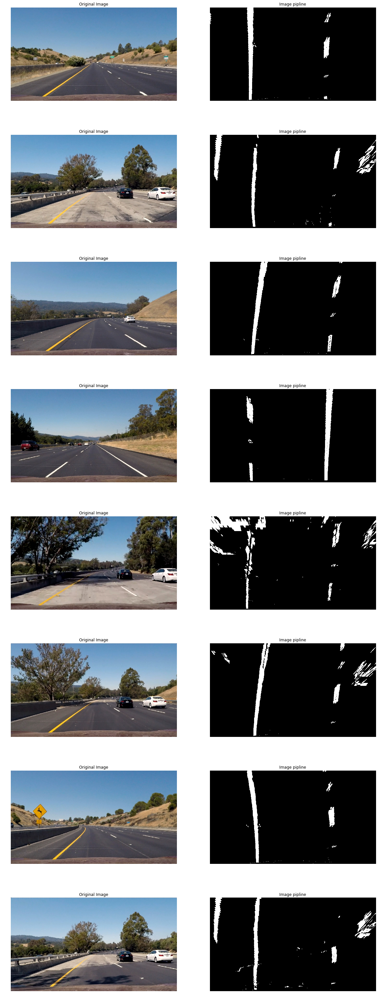

In [12]:
def image_transform_pipline(image):
    undistorted_image = undistort_camera_image(image)
    transform = threshold_transform(undistorted_image)
    roi = region_of_interest(transform)
    prespective = prespective_transform(roi)
    
    return prespective

def test_transform_pipline():
    
    index = get_test_images_size()
    fig, axs = plt.subplots(index, 2, figsize=(20, index * 7))
    
    for i, image_address in enumerate(glob.glob('test_images/*.jpg')):
        image = load_image_from_address(image_address)
        output = image_transform_pipline(image)

        axs[i][0].imshow(image.squeeze())
        axs[i][0].set_title("Original Image")
        axs[i][0].axis('off')

        axs[i][1].imshow(output.squeeze(), cmap='gray')
        axs[i][1].set_title("Image pipline")
        axs[i][1].axis('off')
    
    plt.show()

test_transform_pipline()

### Lane finding algorithms

In [44]:
def find_lines(binary_warped):
    
    histogram = np.sum(binary_warped[int(binary_warped.shape[0] / 2):, :], axis=0)
    
    midpoint = np.int(histogram.shape[0] / 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    nwindows = 9
    window_height = np.int(binary_warped.shape[0] / nwindows)

    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    leftx_current = leftx_base
    rightx_current = rightx_base

    margin = 100
    minpix = 60

    left_lane_inds = []
    right_lane_inds = []

    for window in range(nwindows):
    
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
    
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit


def find_lines_quick(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 150
    
    left_lane_inds = ((nonzerox > (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2] + margin)))

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    return left_fit, right_fit

def get_fitx_and_fity(binary_warped, left_fit, right_fit):
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def get_left_right_curve(binary_warped, left_fit, right_fit):
    
    left_fitx, right_fitx, ploty = get_fitx_and_fity(binary_warped, left_fit, right_fit)
    
    y_eval = np.max(ploty)
    
    ym_per_pix = 30 / 720 
    xm_per_pix = 3.7 / 700

    left_fit_cr = np.polyfit(ploty * ym_per_pix, left_fitx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty * ym_per_pix, right_fitx * xm_per_pix, 2)

    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(2 * right_fit_cr[0])
        
    return (left_curverad + right_curverad) / 2

def get_center_distance(binary_warped, left_fit, right_fit):
    
    xm_per_pix = 3.7 / 700
    
    left_fitx, right_fitx, _ = get_fitx_and_fity(binary_warped, left_fit, right_fit)
    
    position = (np.mean(left_fitx) + np.mean(right_fitx)) / 2
    distance_from_center = abs((640 - position) * xm_per_pix) 
    
    return distance_from_center

def get_lane(image, last_lanes = None):
    
    new_lane = Lane()
    is_last_founded_ok = False
    
    new_lane.binary_warped = image_transform_pipline(image)

    if last_lanes is not None and len(last_lanes) > 0 and last_lanes[-1].is_ok: ### Sanity check
        new_lane.left_fit, new_lane.right_fit = find_lines_quick(new_lane.binary_warped, last_lanes[-1].left_fit, last_lanes[-1].right_fit)
        new_lane.curvature = get_left_right_curve(new_lane.binary_warped, new_lane.left_fit, new_lane.right_fit)
        new_lane.position = get_center_distance(new_lane.binary_warped, new_lane.left_fit, new_lane.right_fit)
        
        if abs(last_lanes[-1].curvature - new_lane.curvature) / new_lane.curvature <= .25:
            is_last_founded_ok = True
    
    if is_last_founded_ok is False:
        new_lane.left_fit, new_lane.right_fit = find_lines(new_lane.binary_warped)
        new_lane.curvature = get_left_right_curve(new_lane.binary_warped, new_lane.left_fit, new_lane.right_fit)
        new_lane.position = get_center_distance(new_lane.binary_warped, new_lane.left_fit, new_lane.right_fit)

    if last_lanes and len(last_lanes) > 0:
        left_diff = (new_lane.left_fit - last_lanes[-1].left_fit) ** 2
        right_diff = (new_lane.right_fit - last_lanes[-1].right_fit) ** 2
        error = np.sum(left_diff + right_diff)
        
        if error > 500.:
            new_lane.left_fit = np.zeros_like(new_lane.left_fit)
            new_lane.right_fit = np.zeros_like(new_lane.right_fit)
            
            for index, lane in enumerate(last_lanes[:4]):
                new_lane.left_fit += lane.left_fit
                new_lane.right_fit += lane.right_fit
            
            new_lane.left_fit /= index
            new_lane.right_fit /= index
            new_lane.is_ok = False
            
        elif error > 100:
            new_lane.left_fit = (new_lane.left_fit + last_lanes[-1].left_fit) / 2
            new_lane.right_fit = (new_lane.right_fit+ last_lanes[-1].right_fit) / 2

    return new_lane

def test_find_lines():
    
    index = get_test_images_size()
    fig, axs = plt.subplots(index, 3, figsize=(20, index * 7))
    
    for i, image_address in enumerate(glob.glob('test_images/*.jpg')):
        test_image = load_image_from_address(image_address)
        lane = get_lane(test_image)
        
        left_fitx, right_fitx, ploty = get_fitx_and_fity(lane.binary_warped, lane.left_fit, lane.right_fit)

        axs[i][0].imshow(test_image.squeeze())
        axs[i][0].set_title("Original Image")
        axs[i][0].axis('off')

        axs[i][1].imshow(lane.binary_warped.squeeze(), cmap='gray')
        axs[i][1].set_title("Pipline Image")
        axs[i][1].axis('off')

        axs[i][2].imshow(lane.binary_warped.squeeze(), cmap='gray')
        axs[i][2].set_title("Finded lines")
        axs[i][2].plot(left_fitx, ploty, color='blue')
        axs[i][2].plot(right_fitx, ploty, color='blue')
        axs[i][2].set_xlim(0, 1280)
        axs[i][2].set_ylim(720, 0)
        axs[i][2].axis('off')
    
    plt.show()

# test_find_lines()


### Drawing image

In [14]:
def draw_lines_on_image(image, binary_warped, left_fit, right_fit):
    left_fitx, right_fitx, ploty = get_fitx_and_fity(binary_warped, left_fit, right_fit)

    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, reverse_prespective_transform_matrix, (image.shape[1], image.shape[0])) 
    
    return cv2.addWeighted(image, 1, newwarp, 0.3, 0)

def draw_text_on_image(image, text, position=(0, 0)):
    cv2.putText(image, text, position, fontFace=1, fontScale=2, color=(255, 255, 255), thickness=2)
    return image

### Finding Lane Pipline

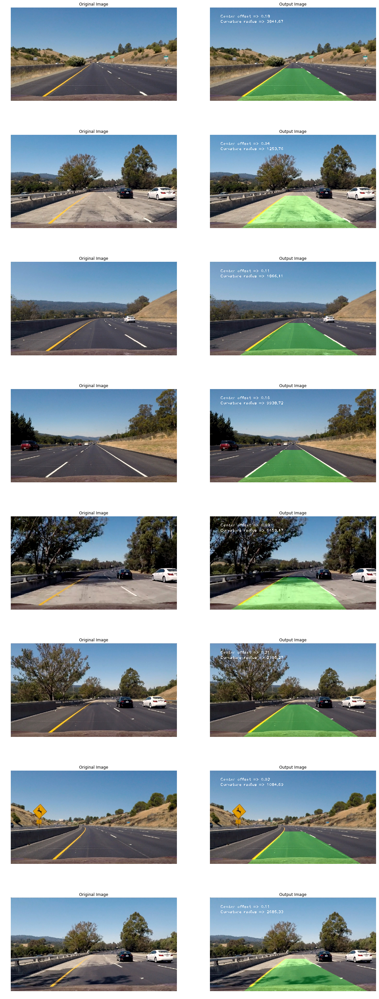

In [15]:
last_turning_curved = None
last_distance_from_center = None

def image_pipline(image, last_lanes = None, update_texts = True):
    
    global last_turning_curved, last_distance_from_center
    
    new_lane = get_lane(image, last_lanes)
    
    if update_texts or last_turning_curved is None or last_distance_from_center is None:
        last_turning_curved = 'Curvature radius => {:.2f}'.format(new_lane.curvature)
        last_distance_from_center = 'Center offset => {:.2f}'.format(new_lane.position)
        
    draw_image = draw_lines_on_image(image, new_lane.binary_warped, new_lane.left_fit, new_lane.right_fit)
    text_image = draw_text_on_image(draw_image, last_distance_from_center, (80, 80))
    text_image = draw_text_on_image(text_image, last_turning_curved, (80, 120))

    return text_image, new_lane
    
def test_image_pipline():
    
    index = get_test_images_size()
    fig, axs = plt.subplots(index, 2, figsize=(20, index * 7))

    for i, image_address in enumerate(glob.glob('test_images/*.jpg')):
        image = load_image_from_address(image_address)
        output, _ = image_pipline(image)
        
        axs[i][0].imshow(image.squeeze())
        axs[i][0].set_title("Original Image")
        axs[i][0].axis('off')
        
        axs[i][1].imshow(output.squeeze())
        axs[i][1].set_title("Output Image")
        axs[i][1].axis('off')
        
        imsave(OUT_PUT_IMAGE_PATTERN.format(i), output.squeeze())
    
    plt.show()

test_image_pipline()

### Video Pipline

In [46]:
video_frame_counter = 1
last_lane = None
last_lanes = []

def video_image_transform(image):
    
    global last_lane, video_frame_counter
    
    output, new_lane = image_pipline(image, last_lanes, video_frame_counter % 10 == 0)
    video_frame_counter = video_frame_counter + 1
    
    if new_lane.is_ok:
        last_lanes.append(new_lane)
        last_lanes.pop(0)
    
    return output

def video_pipline(input_video, output_video):
    
    input_clip = VideoFileClip(input_video)

    outout_clip = input_clip.fl_image(video_image_transform)
    outout_clip.write_videofile(output_video, audio=False)

    
video_pipline('project_video.mp4', 'output_videos/project_video_lanes.mp4')
# video_pipline('challenge_video.mp4', 'output_videos/challenge_video_lanes.mp4')

[MoviePy] >>>> Building video output_videos/project_video_lanes.mp4
[MoviePy] Writing video output_videos/project_video_lanes.mp4







  0%|          | 0/126 [00:00<?, ?it/s]




  1%|          | 1/126 [00:00<00:25,  4.90it/s]




  2%|▏         | 2/126 [00:00<00:26,  4.70it/s]




  2%|▏         | 3/126 [00:00<00:25,  4.83it/s]




  3%|▎         | 4/126 [00:00<00:25,  4.75it/s]




  4%|▍         | 5/126 [00:01<00:24,  4.84it/s]




  5%|▍         | 6/126 [00:01<00:24,  4.82it/s]




  6%|▌         | 7/126 [00:01<00:24,  4.85it/s]




  6%|▋         | 8/126 [00:01<00:25,  4.64it/s]




  7%|▋         | 9/126 [00:01<00:27,  4.24it/s]




  8%|▊         | 10/126 [00:02<00:29,  3.99it/s]




  9%|▊         | 11/126 [00:02<00:29,  3.91it/s]




 10%|▉         | 12/126 [00:02<00:28,  3.96it/s]




 10%|█         | 13/126 [00:02<00:26,  4.22it/s]




 11%|█         | 14/126 [00:03<00:25,  4.39it/s]




 12%|█▏        | 15/126 [00:03<00:25,  4.28it/s]




 13%|█▎        | 16/126 [00:03<00:24,  4.45it/s]




 13%|█▎        | 17/126 [00:03<00:23,  4.59it/s]




 14%|█▍        | 18/126 [00:04<00:23,  4.64it/s]




 15%|█

 95%|█████████▌| 120/126 [00:27<00:01,  3.69it/s]




 96%|█████████▌| 121/126 [00:27<00:01,  3.69it/s]




 97%|█████████▋| 122/126 [00:28<00:01,  3.66it/s]




 98%|█████████▊| 123/126 [00:28<00:00,  3.95it/s]




 98%|█████████▊| 124/126 [00:28<00:00,  4.13it/s]




 99%|█████████▉| 125/126 [00:28<00:00,  4.05it/s]






[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video_lanes.mp4 

